In [1]:
import pandas as pd

In [2]:
cd /Users/Marco/Documents/CSC 478/data

/Users/Marco/Documents/CSC 478/data


In [27]:
census_DF = pd.read_csv("adult-modified.csv",na_values=["?"])

In [28]:
census_DF.head()

,age,workclass,education,marital_status,race,sex,hours_per_week,income
0,39,Public,13,Single,White,Male,40,<=50K
1,50,Self-emp,13,Married,White,Male,13,<=50K
2,38,Private,9,Single,White,Male,40,<=50K
3,53,Private,7,Married,Black,Male,40,<=50K
4,28,Private,13,Married,Black,Female,40,<=50K


In [29]:
census_DF.describe(include="all")

,age,workclass,education,marital_status,race,sex,hours_per_week,income
count,9802.000000,9412,10000.000000,10000,10000,10000,10000.000000,10000
unique,NaN,3,NaN,2,5,2,NaN,2
top,NaN,Private,NaN,Single,White,Male,NaN,<=50K
freq,NaN,6947,NaN,5017,8556,6703,NaN,7621
mean,38.449806,NaN,10.076600,NaN,NaN,NaN,40.530300,NaN
std,13.611949,NaN,2.548172,NaN,NaN,NaN,12.277197,NaN
min,17.000000,NaN,1.000000,NaN,NaN,NaN,1.000000,NaN
25%,27.000000,NaN,9.000000,NaN,NaN,NaN,40.000000,NaN
50%,37.000000,NaN,10.000000,NaN,NaN,NaN,40.000000,NaN
75%,47.000000,NaN,12.000000,NaN,NaN,NaN,45.000000,NaN


## __3a.__
Filling in missing numerical values using the attribute mean.

In [30]:
age_mean = census_DF.age.mean()
edu_mean = census_DF.education.mean()
hr_mean  = census_DF.hours_per_week.mean()

In [31]:
census_DF.age.fillna(age_mean, axis=0, inplace=True)
census_DF.education.fillna(edu_mean, axis=0, inplace=True)
census_DF.hours_per_week.fillna(hr_mean, axis=0, inplace=True)

__Removing the instances where there are missing categorical values.

In [39]:
census_DF.dropna(axis=0,inplace=True)

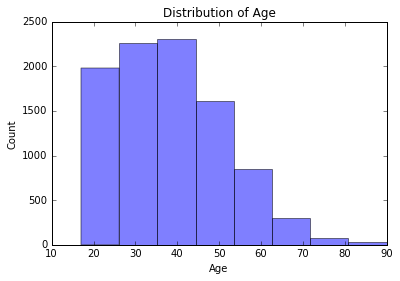

In [101]:
plt.hist(census_DF["age"], bins=8, alpha=0.5)
plt.xlabel('Age')
plt.ylabel('Count')
plt.title('Distribution of Age')

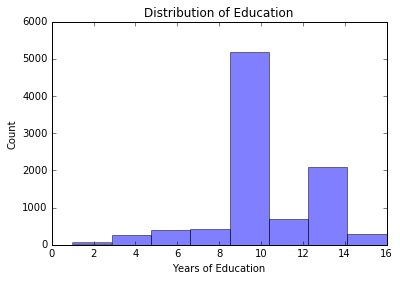

In [102]:
plt.hist(census_DF["education"], bins=8, alpha=0.5)
plt.xlabel('Years of Education')
plt.ylabel('Count')
plt.title('Distribution of Education')

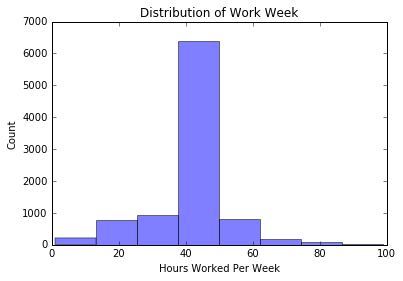

In [103]:
plt.hist(census_DF["hours_per_week"], bins=8, alpha=0.5)
plt.xlabel('Hours Worked Per Week')
plt.ylabel('Count')
plt.title('Distribution of Work Week')

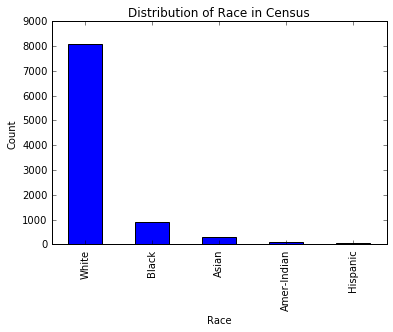

In [106]:
plt.xlabel('Race')
plt.ylabel('Count')
plt.title('Distribution of Race in Census')
census_DF["race"].value_counts().plot(kind='bar')

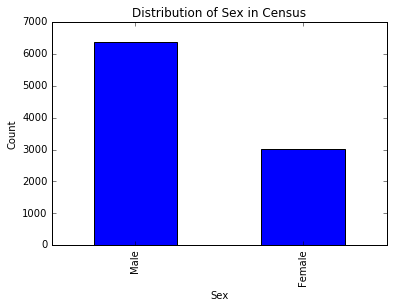

In [113]:
plt.xlabel('Sex')
plt.ylabel('Count')
plt.title('Distribution of Sex in Census')
census_DF["sex"].value_counts().plot(kind='bar')

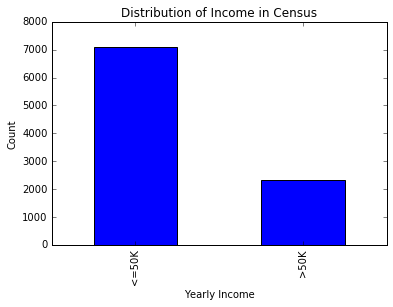

In [114]:
plt.xlabel('Yearly Income')
plt.ylabel('Count')
plt.title('Distribution of Income in Census')
census_DF["income"].value_counts().plot(kind='bar')

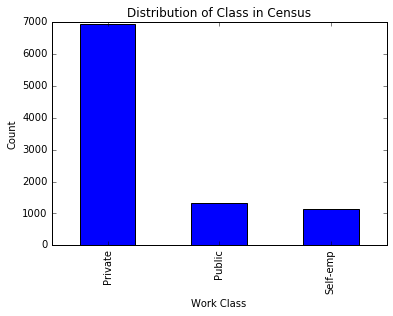

In [115]:
plt.xlabel('Work Class')
plt.ylabel('Count')
plt.title('Distribution of Class in Census')
census_DF["workclass"].value_counts().plot(kind='bar')

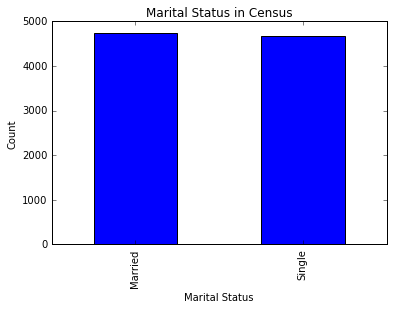

In [116]:
plt.xlabel('Marital Status')
plt.ylabel('Count')
plt.title('Marital Status in Census')
census_DF["marital_status"].value_counts().plot(kind='bar')

__Cross-tabulation of Education & Race__

In [40]:
edu_race = pd.crosstab(census_DF["education"], census_DF["race"])
edu_race

race,Amer-Indian,Asian,Black,Hispanic,White
education,,,,,
1,0,0,1,0,11
2,0,1,4,3,38
3,0,4,5,1,71
4,5,5,14,6,150
5,0,3,19,2,118
6,8,3,30,4,223
7,4,6,49,4,261
8,0,2,17,3,78
9,35,67,350,23,2590


In [41]:
import matplotlib.pyplot as plt
%matplotlib inline

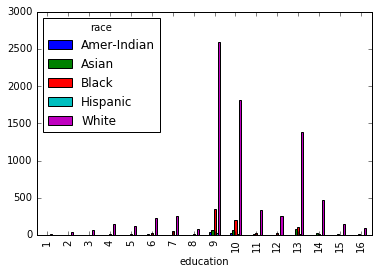

In [42]:
plt.show(edu_race.plot(kind="bar"))

For some of these graphs I tried scaling them but I couldn't figure out how to do it. There is so much more White people in the census so it skews the graph, making it hard to read the other data.

__Cross-tabulation of Class & Income__

In [43]:
class_income = pd.crosstab(census_DF["workclass"], census_DF["income"])
class_income

income,<=50K,>50K
workclass,,
Private,5443,1504
Public,925,392
Self-emp,725,423


<function matplotlib.pyplot.show>

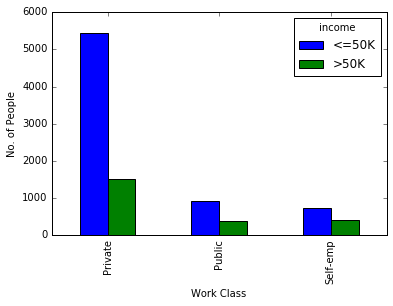

In [123]:
class_income.plot(kind="bar")
plt.ylabel('No. of People')
plt.xlabel('Work Class')
plt.show

__Cross-tabulation of Class & Race__

In [49]:
class_race = pd.crosstab(census_DF["workclass"], census_DF["race"])
class_race

race,Amer-Indian,Asian,Black,Hispanic,White
workclass,,,,,
Private,65,204,664,64,5950
Public,20,48,192,5,1052
Self-emp,7,39,36,6,1060


<function matplotlib.pyplot.show>

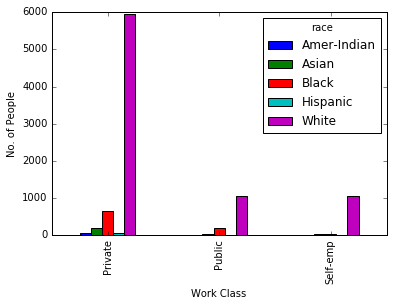

In [124]:
class_race.plot(kind="bar")
plt.ylabel('No. of People')
plt.xlabel('Work Class')
plt.show

__Cross-tabulation of Race & Income__

In [52]:
race_income = pd.crosstab(census_DF["race"], census_DF["income"])
race_income

income,<=50K,>50K
race,,
Amer-Indian,83,9
Asian,224,67
Black,773,119
Hispanic,69,6
White,5944,2118


<function matplotlib.pyplot.show>

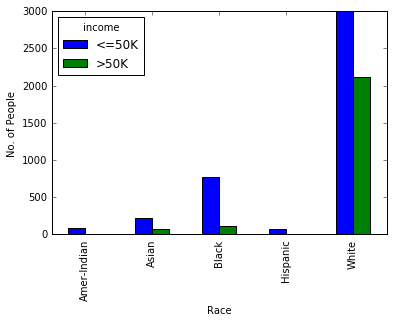

In [136]:
race_income[['<=50K','>50K']].plot(kind="bar")
plt.ylabel('No. of People')
plt.xlabel('Race')
plt.ylim(ymax=3000)
plt.show

__Percentage of each race that are low income__

In [60]:
race_income["% Low Income"]=race_income["<=50K"]/(race_income["<=50K"]+race_income[">50K"])
race_income

income,<=50K,>50K,% Low Income
race,,,
Amer-Indian,83,9,0.902174
Asian,224,67,0.769759
Black,773,119,0.866592
Hispanic,69,6,0.920000
White,5944,2118,0.737286


__The percent of low income is highest among minorities (Hispanic being the highest at 92%). Asians and Whites have the lowest percentage of low income population.__

In [117]:
edu_income = pd.crosstab(census_DF["education"], census_DF["income"])
edu_income

income,<=50K,>50K
education,,
1,12,0
2,45,1
3,76,5
4,164,16
5,135,7
6,245,23
7,310,14
8,93,7
9,2539,526


<function matplotlib.pyplot.show>

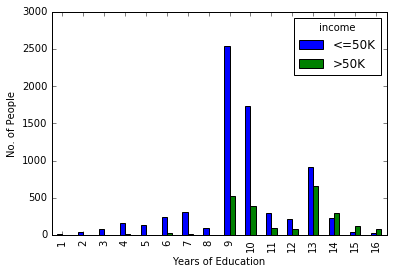

In [127]:
edu_income.plot(kind="bar")
plt.ylabel('No. of People')
plt.xlabel('Years of Education')
plt.show

__No surprise here, wealthy people spend more time in school.__

In [120]:
hweek_income = pd.crosstab(census_DF["hours_per_week"], census_DF["income"])


<function matplotlib.pyplot.show>

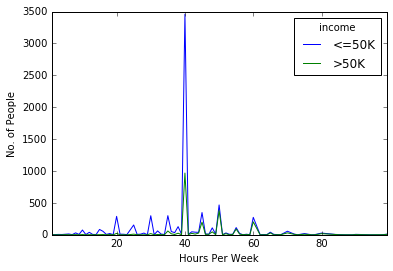

In [132]:
hweek_income.plot()
plt.ylabel('No. of People')
plt.xlabel('Hours Per Week')
plt.show

__They also work less. Perhaps because they make more money per hour__

In [130]:
married_income = pd.crosstab(census_DF["marital_status"], census_DF["income"])
married_income

income,<=50K,>50K
marital_status,,
Married,2730,2007
Single,4363,312


<function matplotlib.pyplot.show>

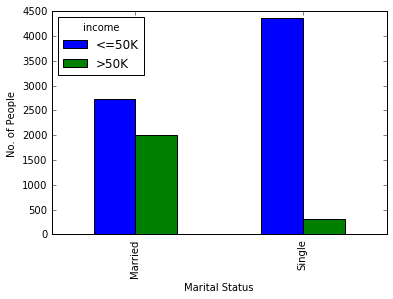

In [133]:
married_income.plot(kind='bar')
plt.ylabel('No. of People')
plt.xlabel('Marital Status')
plt.show

__There seem to be more wealthy married people than wealthy single people. Perhaps because of combined wealth or perhaps because of being older.__

## __3b.__
Create dummy variables using pandas get_dummies.
Separate the target attribute(income_>50k). 

In [66]:
census_ssf = pd.get_dummies(census_DF,prefix='')
census_ssf.head(10)

,age,education,hours_per_week,_Private,_Public,_Self-emp,_Married,_Single,_Amer-Indian,_Asian,_Black,_Hispanic,_White,_Female,_Male,_<=50K,_>50K
0,39,13,40,0,1,0,0,1,0,0,0,0,1,0,1,1,0
1,50,13,13,0,0,1,1,0,0,0,0,0,1,0,1,1,0
2,38,9,40,1,0,0,0,1,0,0,0,0,1,0,1,1,0
3,53,7,40,1,0,0,1,0,0,0,1,0,0,0,1,1,0
4,28,13,40,1,0,0,1,0,0,0,1,0,0,1,0,1,0
5,37,14,40,1,0,0,1,0,0,0,0,0,1,1,0,1,0
6,49,5,16,1,0,0,1,0,0,0,1,0,0,1,0,1,0
7,52,9,45,0,0,1,1,0,0,0,0,0,1,0,1,0,1
8,31,14,50,1,0,0,0,1,0,0,0,0,1,1,0,0,1
9,42,13,40,1,0,0,1,0,0,0,0,0,1,0,1,0,1


In [70]:
census_record = census_ssf[census_ssf.columns[0:-2]]
census_target = census_ssf[census_ssf.columns[-1]]

In [72]:
from sklearn.cross_validation import train_test_split
from sklearn import preprocessing
from sklearn import tree, naive_bayes
from sklearn.lda import LDA
from sklearn import cross_validation

/Users/Marco/anaconda/lib/python2.7/site-packages/sklearn/lda.py:4: DeprecationWarning: lda.LDA has been moved to discriminant_analysis.LinearDiscriminantAnalysis in 0.17 and will be removed in 0.19
  "in 0.17 and will be removed in 0.19", DeprecationWarning)


__Splitting the data into training and test portions then normalize it__

In [73]:
census_train, census_test, census_target_train, census_target_test = train_test_split(census_record, census_target, test_size=0.2, random_state=33)

In [75]:
min_max_scaler = preprocessing.MinMaxScaler().fit(census_train)
bank_train_norm = min_max_scaler.transform(census_train)
bank_test_norm = min_max_scaler.transform(census_test)

__Naive Bayes__

In [76]:
nbclf = naive_bayes.GaussianNB()
nbclf = nbclf.fit(census_train,census_target_train)
nbpreds_test = nbclf.predict(census_test)

[ 1.  1.  0. ...,  1.  0.  1.]


In [78]:
print nbclf.score(census_train,census_target_train)
print nbclf.score(census_test,census_target_test)

0.720547217426
0.719065321296


__Decision Tree__

In [80]:
treeclf = tree.DecisionTreeClassifier(criterion='entropy', min_samples_split=3)
treeclf = treeclf.fit(census_train, census_target_train)
treepreds_test = treeclf.predict(census_test)
print treepreds_test

[ 0.  1.  0. ...,  0.  0.  1.]


In [82]:
print treeclf.score(census_test,census_target_test)
print treeclf.score(census_train,census_target_train)

0.776420605417
0.93026962412


__Linear Discriminant Analysis__

In [83]:
ldclf = LDA()
ldclf = ldclf.fit(census_train,census_target_train)
ldpreds_test = ldclf.predict(census_test)
print ldpreds_test

[ 1.  0.  0. ...,  0.  0.  1.]


/Users/Marco/anaconda/lib/python2.7/site-packages/sklearn/discriminant_analysis.py:387: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")


In [84]:
print ldclf.score(census_record, census_target)

0.807267318317


__10-fold cross-validation for the following classifiers:__
- naive Bayes
- Decision tree
- Linear discriminant analysis

In [85]:
cv_nb   = cross_validation.cross_val_score(nbclf,census_record,census_target, cv=10)
cv_tree = cross_validation.cross_val_score(treeclf,census_record,census_target, cv=10)
cv_lda  = cross_validation.cross_val_score(ldclf,census_record,census_target, cv=10)

In [87]:
print("Overall Accuracy (Naive Bayes): %0.2f (+/- %0.2f)" % (cv_nb.mean(), cv_nb.std() * 2))
print("Overall Accuracy (Decision Tree): %0.2f (+/- %0.2f)" % (cv_tree.mean(), cv_tree.std() * 2))
print("Overall Accuracy (LDA): %0.2f (+/- %0.2f)" % (cv_lda.mean(), cv_lda.std() * 2))

Overall Accuracy (Naive Bayes): 0.72 (+/- 0.02)
Overall Accuracy (Decision Tree): 0.77 (+/- 0.03)
Overall Accuracy (LDA): 0.81 (+/- 0.02)


__My attempt at the extra-credit__

In [91]:
from StringIO import StringIO

In [92]:
tree.export_graphviz(treeclf,out_file='tree.dot', feature_names=list(census_record))

In [95]:
cd /Users/Marco/Documents/CSC 478/data

/Users/Marco/Documents/CSC 478/data


In [97]:
from IPython.display import Image
Image(filename='tree.png')